<a href="https://colab.research.google.com/github/Rohit-Nikam/Machine_Learning-CAP-5610-/blob/master/ML_Assignment_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import zipfile
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from keras.applications import VGG19
from keras import layers
from keras import models
from keras import optimizers
from tensorflow.keras import Model
from keras.preprocessing.image import ImageDataGenerator
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
from keras import backend as K
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions
from keras import utils
import time
import pandas as pd
import matplotlib.patheffects as PathEffects
import seaborn as sns
from sklearn.manifold import TSNE
%matplotlib inline


Using TensorFlow backend.


In [2]:
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip \
    -O /tmp/cats_and_dogs_filtered.zip

--2019-04-18 03:59:28--  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.202.128, 2607:f8b0:4001:c00::80
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.202.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘/tmp/cats_and_dogs_filtered.zip’

/tmp/cats_and_dogs_ 100%[===================>]  65.43M   134MB/s    in 0.5s    

2019-04-18 03:59:28 (134 MB/s) - ‘/tmp/cats_and_dogs_filtered.zip’ saved [68606236/68606236]



In [0]:
local_zip = '/tmp/cats_and_dogs_filtered.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp')
zip_ref.close()


In [4]:
!ls /tmp/cats_and_dogs_filtered

train  validation  vectorize.py


In [0]:
base_dir = '/tmp/cats_and_dogs_filtered'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')

# Directory with our training cat pictures
train_cats_dir = os.path.join(train_dir, 'cats')

# Directory with our training dog pictures
train_dogs_dir = os.path.join(train_dir, 'dogs')

# Directory with our validation cat pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')

# Directory with our validation dog pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')

In [6]:
print('total training cat images:', len(os.listdir(train_cats_dir)))
print('total training dog images:', len(os.listdir(train_dogs_dir)))
print()
print('total validation cat images:', len(os.listdir(validation_cats_dir)))
print('total validation dog images:', len(os.listdir(validation_dogs_dir)))

total training cat images: 1000
total training dog images: 1000

total validation cat images: 500
total validation dog images: 500


In [0]:
# Parameters for our graph; we'll output images in a 4x4 configuration
nrows = 4
ncols = 4

# Index for iterating over images
pic_index = 8

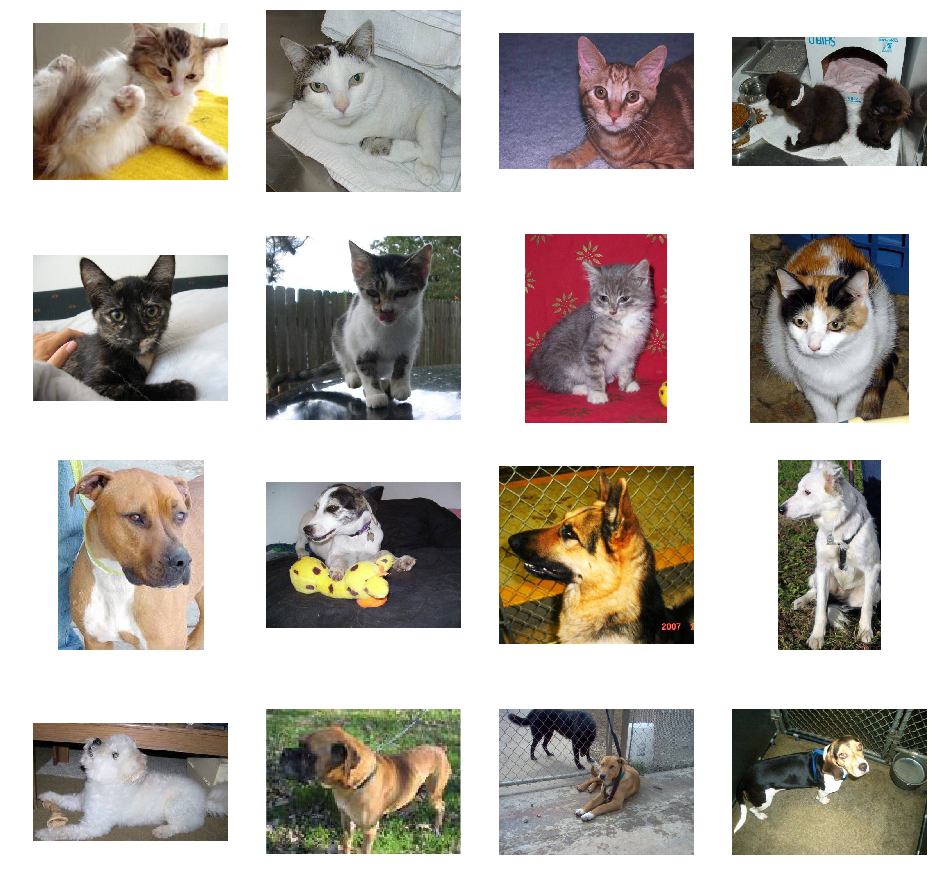

In [8]:
train_cat_fnames = os.listdir(train_cats_dir)
train_cat_fnames.sort()
train_dog_fnames = os.listdir(train_dogs_dir)
train_dog_fnames.sort()
# Set up matplotlib fig, and size it to fit 4x4 pics
fig = plt.gcf()
fig.set_size_inches(ncols * 4, nrows * 4)

pic_index += 8
next_cat_pix = [os.path.join(train_cats_dir, fname) 
                for fname in train_cat_fnames[pic_index-8:pic_index]]
next_dog_pix = [os.path.join(train_dogs_dir, fname) 
                for fname in train_dog_fnames[pic_index-8:pic_index]]

for i, img_path in enumerate(next_cat_pix + next_dog_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()

#*Problem 1*

In [9]:
conv_base = VGG19(
    weights='imagenet', 
    include_top=False, 
    input_shape=(224, 224, 3))
conv_base.summary()

Instructions for updating:
Colocations handled automatically by placer.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
bloc

In [0]:
conv_base.trainable = False


In [11]:
for layer in conv_base.layers:
  layer.trainable = False
  
last_layer = conv_base.get_layer('block5_pool')
print('last layer output shape:', last_layer.output_shape)
last_output = last_layer.output

last layer output shape: (None, 7, 7, 512)


In [12]:
x = layers.Flatten()(last_output)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dense(1, activation='sigmoid')(x)

# Configure and compile the model
model = models.Model(conv_base.input, x)
model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(lr=0.0001),
              metrics=['acc'])

model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [13]:
# data augmentation

train_datagen = ImageDataGenerator(
    rescale=1./255, 
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=20,
    class_mode='binary')

validation_datagen = ImageDataGenerator(rescale=1./255)

validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(224, 224),
    batch_size=20,
    class_mode='binary')

# compile model

model.compile(
    loss='binary_crossentropy', 
    optimizer=optimizers.RMSprop(lr=2e-5), 
    metrics=['acc'])

# train

history = model.fit_generator(
    train_generator,
    steps_per_epoch=100,
    epochs=30,
    validation_data=validation_generator,
    validation_steps=50
)



Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Instructions for updating:
Use tf.cast instead.
Epoch 1/30
100/100 [==============================] - 37s 373ms/step - loss: 0.6005 - acc: 0.6700 - val_loss: 0.4668 - val_acc: 0.7640
Epoch 2/30
100/100 [==============================] - 31s 312ms/step - loss: 0.4781 - acc: 0.7725 - val_loss: 0.3776 - val_acc: 0.8160
Epoch 3/30
100/100 [==============================] - 32s 322ms/step - loss: 0.4118 - acc: 0.8170 - val_loss: 0.2899 - val_acc: 0.8840
Epoch 4/30
100/100 [==============================] - 33s 326ms/step - loss: 0.3876 - acc: 0.8235 - val_loss: 0.2698 - val_acc: 0.8880
Epoch 5/30
100/100 [==============================] - 32s 317ms/step - loss: 0.3730 - acc: 0.8350 - val_loss: 0.4163 - val_acc: 0.7950
Epoch 6/30
100/100 [==============================] - 33s 328ms/step - loss: 0.3654 - acc: 0.8315 - val_loss: 0.2633 - val_acc: 0.8850
Epoch 7/30
100/100 [==============================] - 32s 

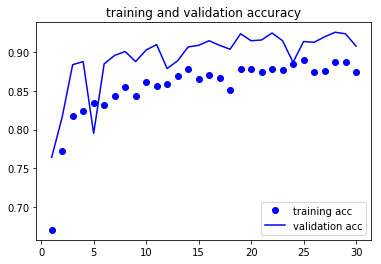

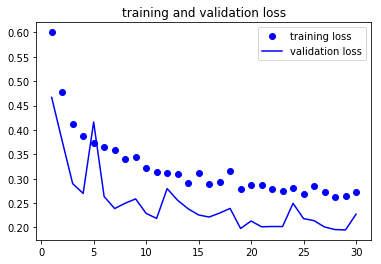

In [14]:
acc = history.history['acc']
val_acc = history.history['val_acc']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

# training and validation accuracy

plt.plot(epochs, acc, 'bo', label='training acc')
plt.plot(epochs, val_acc, 'b', label='validation acc')
plt.title('training and validation accuracy')
plt.legend()

plt.figure()

# training and validation loss

plt.plot(epochs, loss, 'bo', label='training loss')
plt.plot(epochs, val_loss, 'b', label='validation loss')
plt.title('training and validation loss')
plt.legend()

plt.show()

#*Problem 2*

In [15]:
conv_base.trainable = True

set_trainable = False
for layer in conv_base.layers:
  if layer.name == 'block5_conv1':
    set_trainable = True
  if set_trainable:
    layer.trainable = True
  else:
    layer.trainable = False


# compile model

model.compile(
    loss='binary_crossentropy',
    optimizer=optimizers.RMSprop(lr=1e-5), 
    metrics=['acc'])
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [16]:
# train

history = model.fit_generator(
    train_generator,
    steps_per_epoch=100,
    epochs=50,
    validation_data=validation_generator,
    validation_steps=50)



Epoch 1/50
100/100 [==============================] - 38s 376ms/step - loss: 0.2703 - acc: 0.8890 - val_loss: 0.2571 - val_acc: 0.9000
Epoch 2/50
100/100 [==============================] - 34s 344ms/step - loss: 0.2099 - acc: 0.9155 - val_loss: 0.2741 - val_acc: 0.8840
Epoch 3/50
100/100 [==============================] - 34s 343ms/step - loss: 0.1949 - acc: 0.9120 - val_loss: 0.1642 - val_acc: 0.9400
Epoch 4/50
100/100 [==============================] - 33s 331ms/step - loss: 0.1721 - acc: 0.9285 - val_loss: 0.1491 - val_acc: 0.9440
Epoch 5/50
100/100 [==============================] - 34s 338ms/step - loss: 0.1656 - acc: 0.9375 - val_loss: 0.1137 - val_acc: 0.9530
Epoch 6/50
100/100 [==============================] - 34s 338ms/step - loss: 0.1358 - acc: 0.9420 - val_loss: 0.1152 - val_acc: 0.9590
Epoch 7/50
100/100 [==============================] - 33s 330ms/step - loss: 0.1398 - acc: 0.9495 - val_loss: 0.1494 - val_acc: 0.9480
Epoch 8/50
100/100 [==============================] - 3

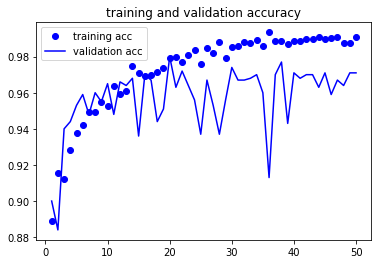

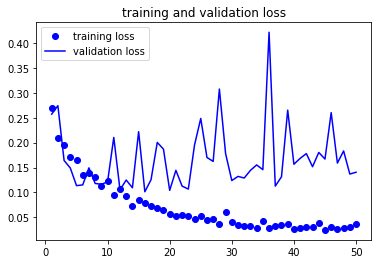

In [17]:
acc = history.history['acc']
val_acc = history.history['val_acc']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

# training and validation accuracy

plt.plot(epochs, acc, 'bo', label='training acc')
plt.plot(epochs, val_acc, 'b', label='validation acc')
plt.title('training and validation accuracy')
plt.legend()

plt.figure()

# training and validation loss

plt.plot(epochs, loss, 'bo', label='training loss')
plt.plot(epochs, val_loss, 'b', label='validation loss')
plt.title('training and validation loss')
plt.legend()

plt.show()

In [0]:

val_loss, val_acc = model.evaluate_generator(validation_generator, steps=50)

In [19]:
print("Validation loss:", val_loss)
print("Validation accuracy:", val_acc)

Validation loss: 0.17401791818101628
Validation accuracy: 0.9669999921321869


#*Problem 3 *

In [0]:
last_conv_layer = model.get_layer('block5_conv4')

In [0]:
def show_superimposed_image(img_path, heatmap):

  img = cv2.imread(img_path)
  # resize the heatmap to be the same size as the original image
  heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

  heatmap = np.uint8(255 * heatmap)

  heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

  superimposed_img = heatmap * 0.4 + img

  cv2_imshow(superimposed_img)
  
def process_image(img_path, idx=0):
  img = image.load_img(img_path, target_size=(224, 224))
  plt.imshow(img)
  plt.grid(None)
  plt.show()
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)
  x = preprocess_input(x)
  preds = model.predict(x)
 
  grads = K.gradients(model.output[:, 0], last_conv_layer.output)[0]
  pooled_grads = K.mean(grads, axis=(0, 1, 2))
  iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])
  pooled_grads_value, conv_layer_output_value = iterate([x])
  
  heatmap = np.mean(conv_layer_output_value, axis=-1)
  heatmap = np.maximum(heatmap, 0)
  heatmap /= np.max(heatmap)

  plt.matshow(heatmap)
  plt.grid(None)
  plt.show()
  show_superimposed_image(img_path, heatmap)

In [22]:
!ls /tmp/cats_and_dogs_filtered/validation/cats | head -5
!ls /tmp/cats_and_dogs_filtered/validation/dogs | head -5

cat.2000.jpg
cat.2001.jpg
cat.2002.jpg
cat.2003.jpg
cat.2004.jpg
dog.2000.jpg
dog.2001.jpg
dog.2002.jpg
dog.2003.jpg
dog.2004.jpg


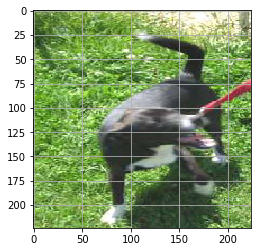

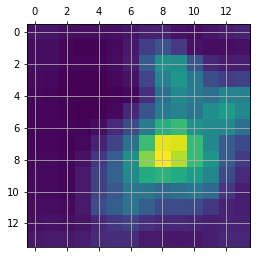

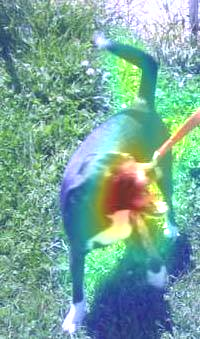

In [23]:
process_image('/tmp/cats_and_dogs_filtered/validation/dogs/dog.2000.jpg')

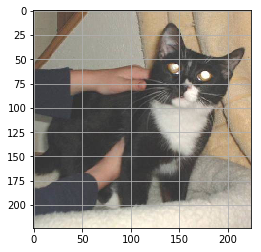

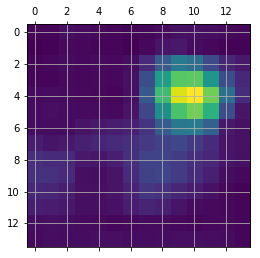

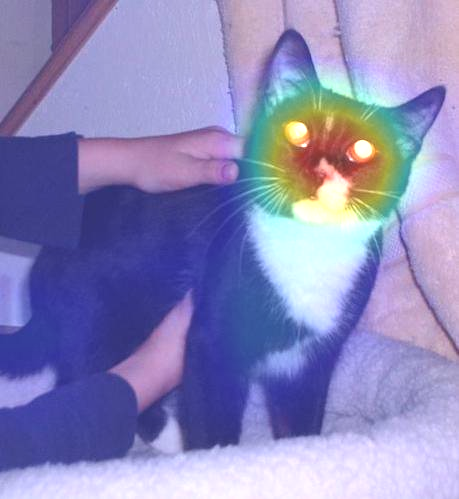

In [24]:
process_image('/tmp/cats_and_dogs_filtered/validation/cats/cat.2000.jpg')

#Problem 4

In [25]:
!ls /tmp/cats_and_dogs_filtered/validation/cats | head -5
!ls /tmp/cats_and_dogs_filtered/validation/dogs | head -5

cat.2000.jpg
cat.2001.jpg
cat.2002.jpg
cat.2003.jpg
cat.2004.jpg
dog.2000.jpg
dog.2001.jpg
dog.2002.jpg
dog.2003.jpg
dog.2004.jpg


In [0]:
def Create_image_tensor(img_path):
  img = image.load_img(img_path, target_size=(224, 224))
  img_tensor = image.img_to_array(img)
  img_tensor = np.expand_dims(img_tensor, axis=0)
  img_tensor /= 255.
  return img_tensor

In [0]:
img_path = '/tmp/cats_and_dogs_filtered/validation/dogs/dog.2000.jpg'
dog_2000_tensor = Create_image_tensor(img_path)

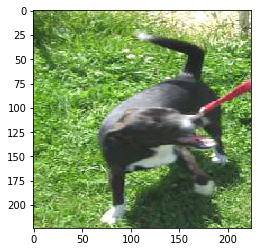

In [28]:
plt.imshow(dog_2000_tensor[0])
plt.show()

In [29]:
model.predict(dog_2000_tensor)

array([[1.]], dtype=float32)

In [30]:
layer_outputs = [layer.output for layer in model.layers[1:25]]
activation_model = models.Model(outputs=layer_outputs,input=model.input)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: UserWarning: Update your `Model` call to the Keras 2 API: `Model(outputs=[<tf.Tenso..., inputs=Tensor("in...)`
  


In [0]:
activations = activation_model.predict(dog_2000_tensor)

In [0]:
def visualize_ConvNETs(layerIndex):
  
  layer_name = model.layers[layerIndex].name
  
  images_per_row = 16

  layer_activation = activations[layerIndex-1]
  # the feature map has shape (1, size, size, n_features)
  n_features = activations[layerIndex-1].shape[-1] 
  size = layer_activation.shape[1]
  n_cols = n_features // images_per_row
  display_grid = np.zeros((size * n_cols, images_per_row * size))

  for col in range(n_cols):
    for row in range(images_per_row):
      channel_image = layer_activation[0, :, :, col * images_per_row + row]

      channel_image -= channel_image.mean()
      if(channel_image.std() != 0):
        channel_image /= channel_image.std()
      channel_image *= 64
      channel_image += 128
      channel_image = np.clip(channel_image, 0, 255).astype('uint8')
      display_grid[
          col * size : (col + 1) * size,
          row * size : (row + 1) * size] = channel_image


  scale = 1. / size
  plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
  plt.title(layer_name)
  plt.grid(False)
  plt.imshow(display_grid, aspect='auto', cmap='viridis')

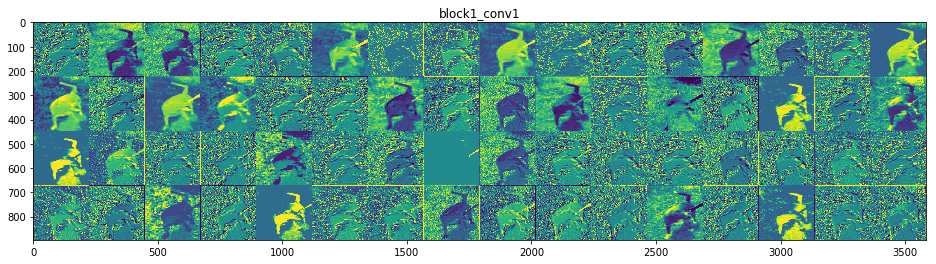

In [33]:
visualize_ConvNETs(1)

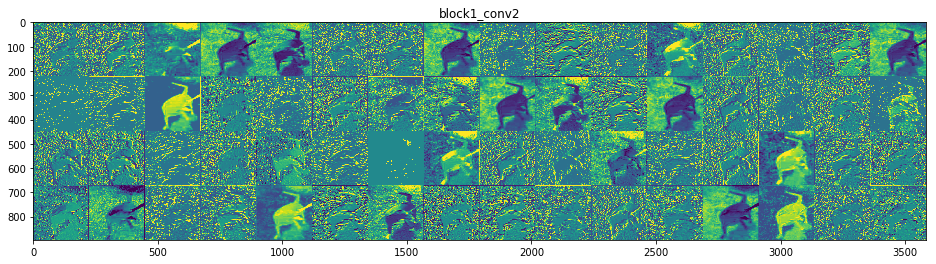

In [34]:
visualize_ConvNETs(2)

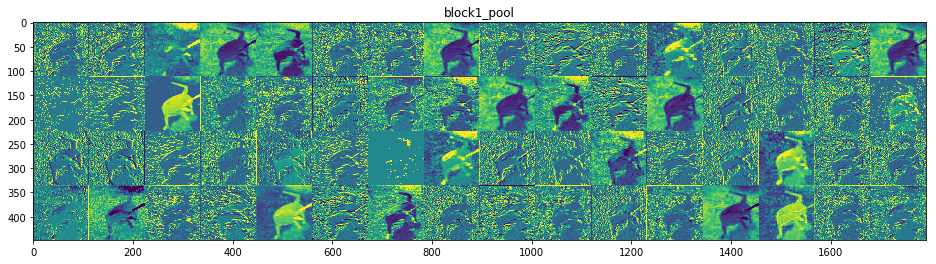

In [35]:
visualize_ConvNETs(3)

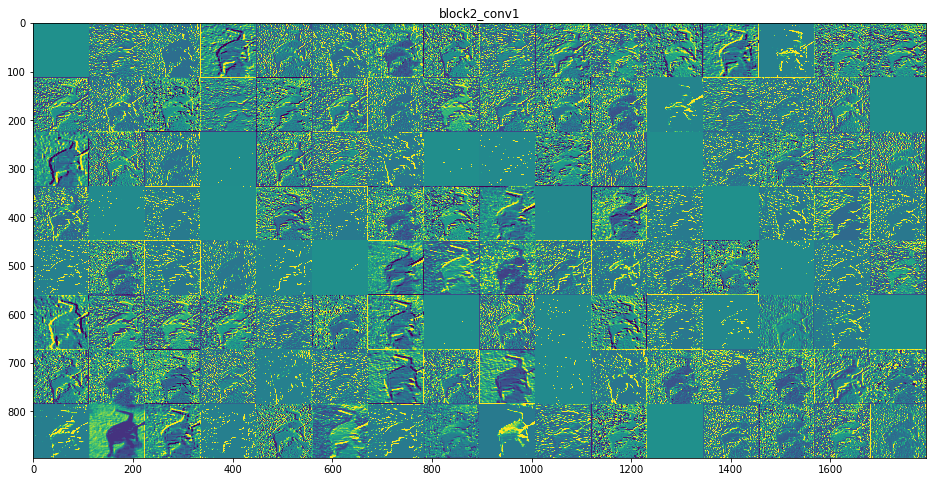

In [36]:
visualize_ConvNETs(4)

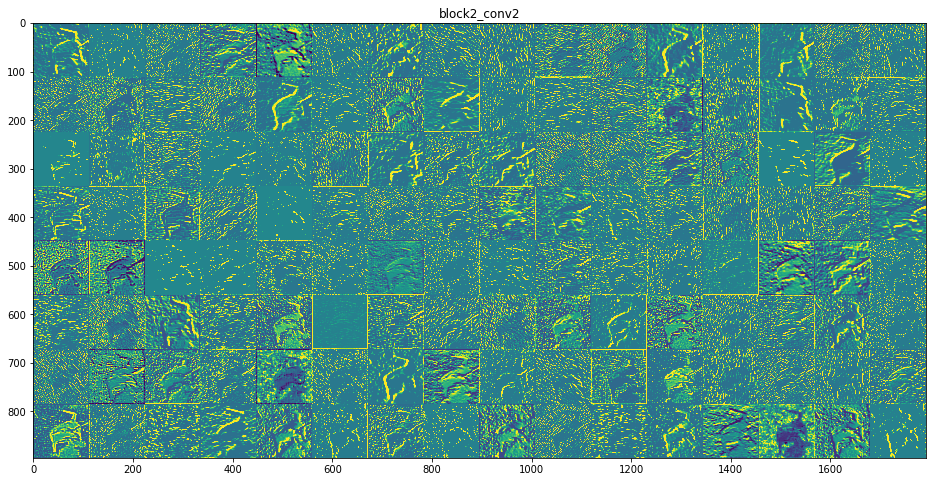

In [37]:
visualize_ConvNETs(5)

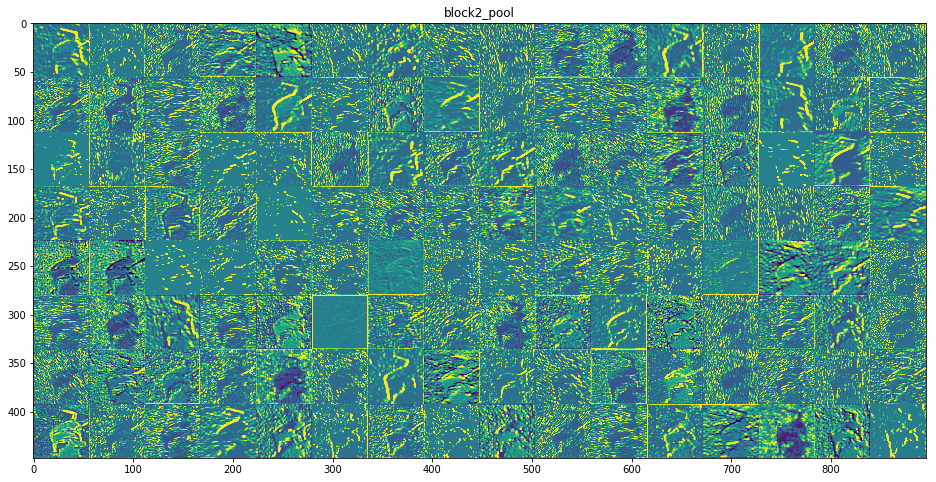

In [38]:
visualize_ConvNETs(6)

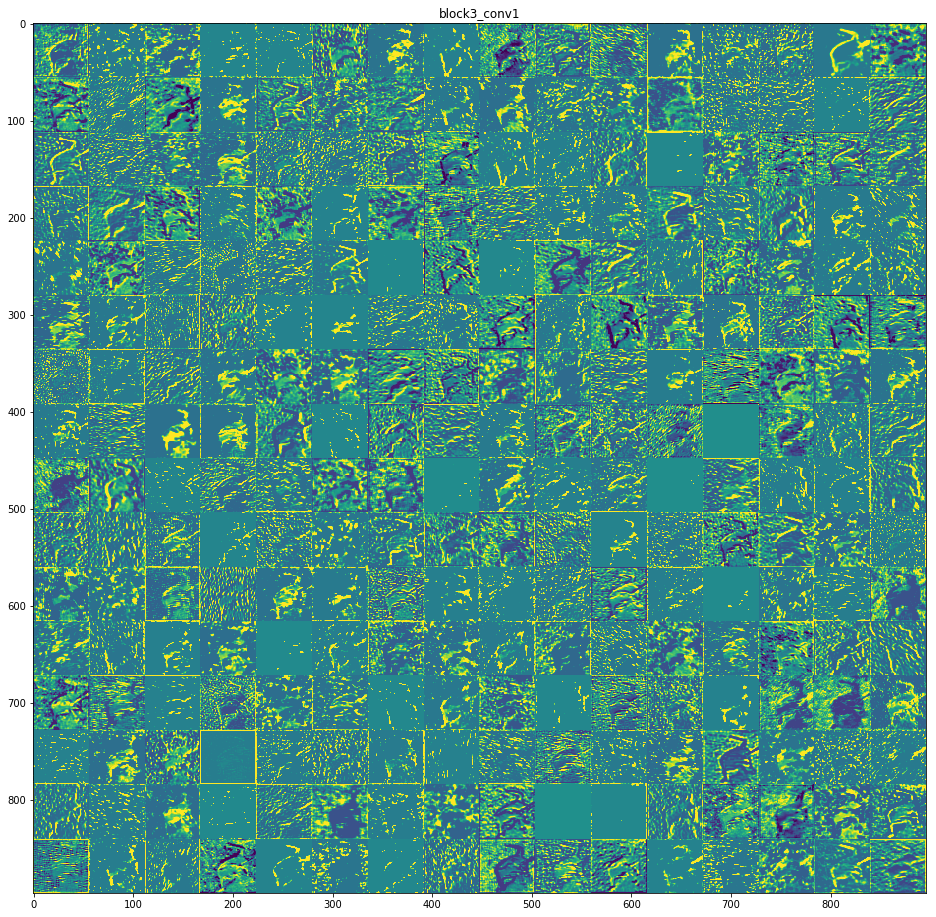

In [39]:
visualize_ConvNETs(7)

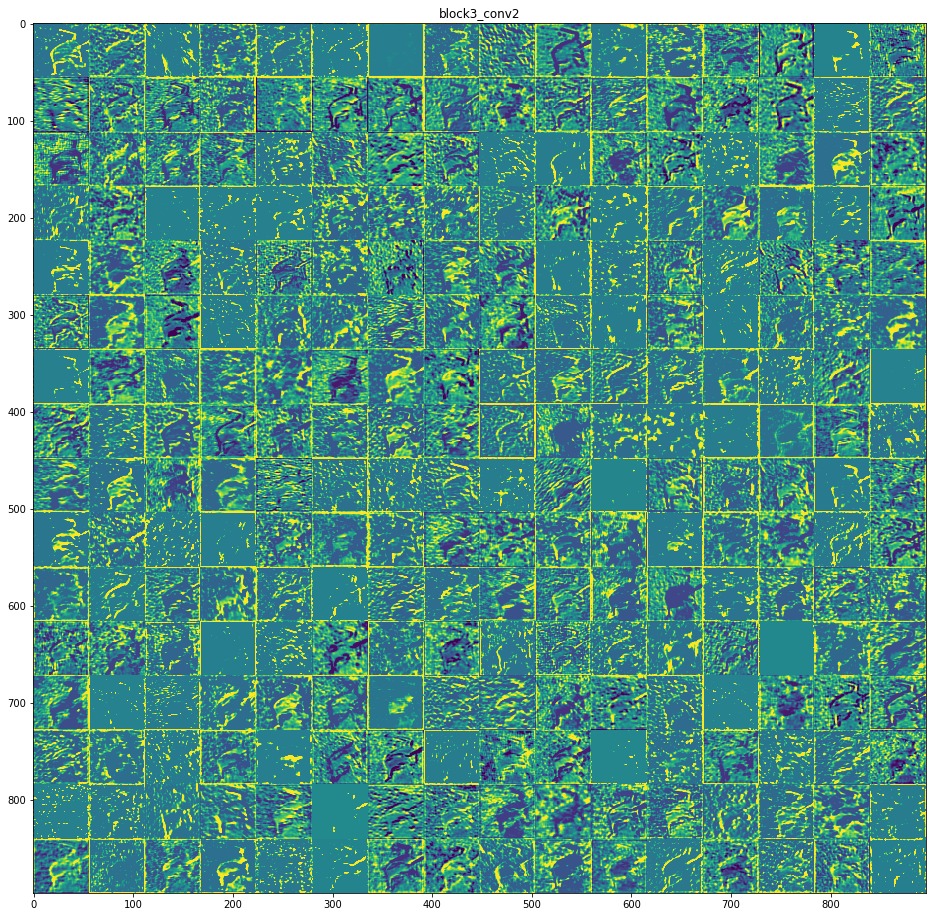

In [40]:
visualize_ConvNETs(8)

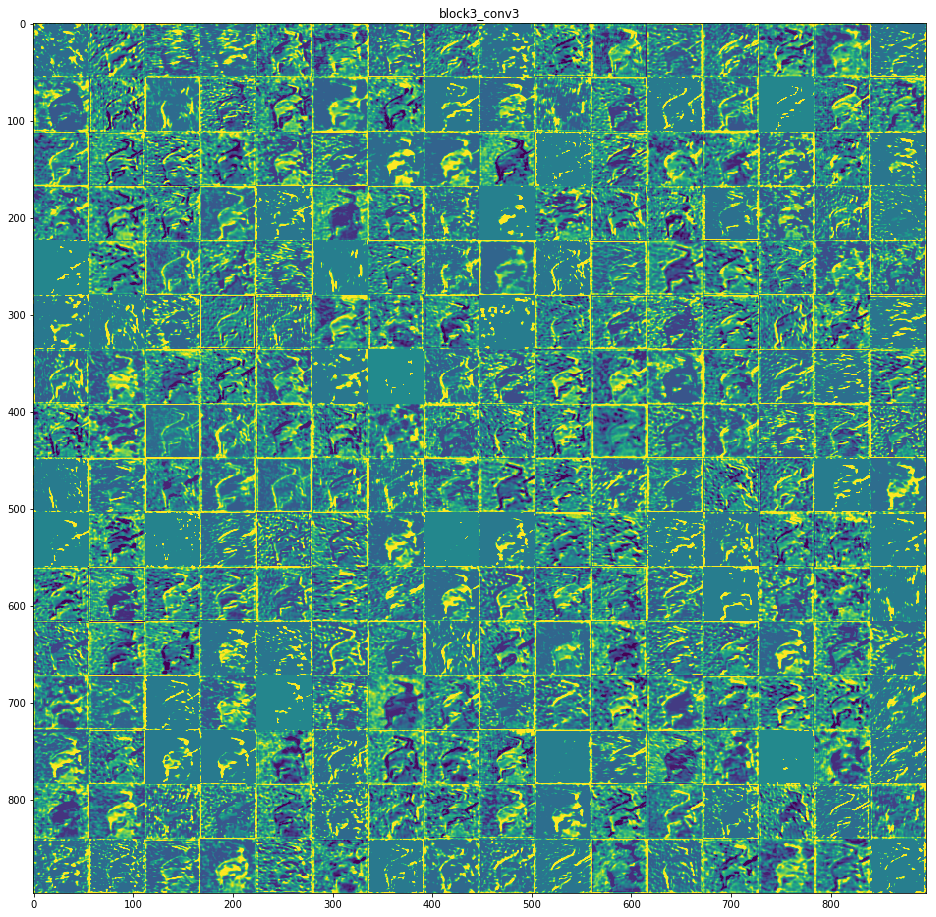

In [41]:
visualize_ConvNETs(9)

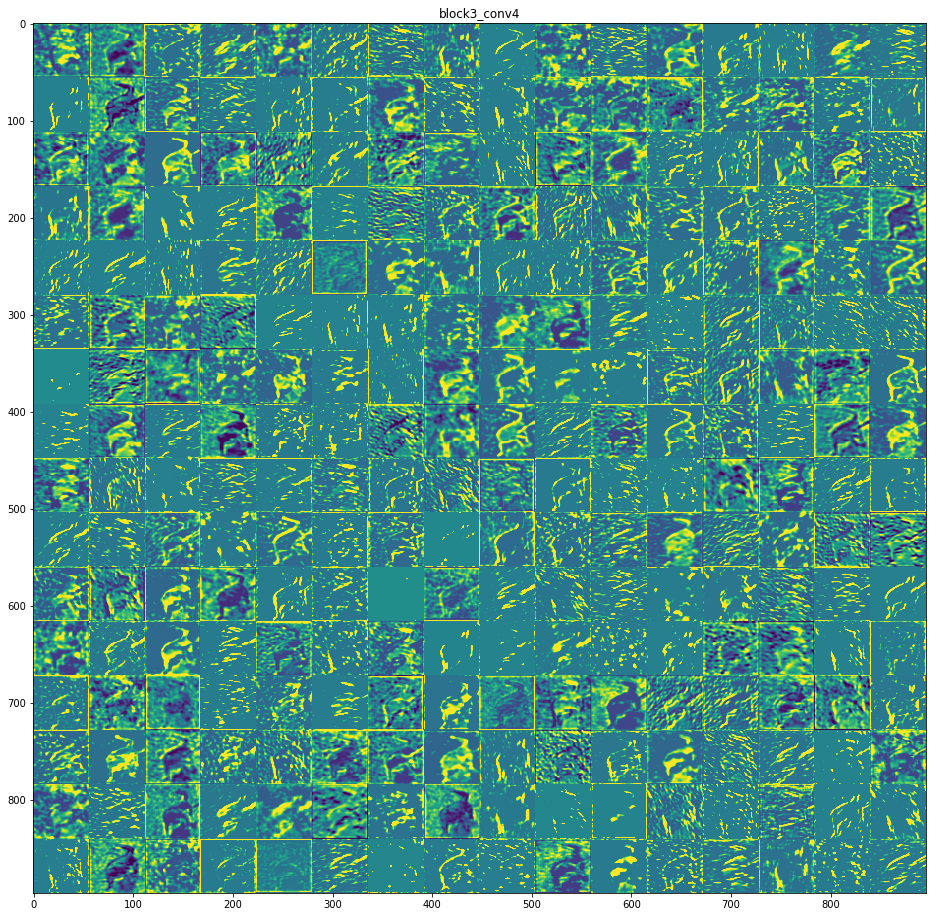

In [42]:
visualize_ConvNETs(10)

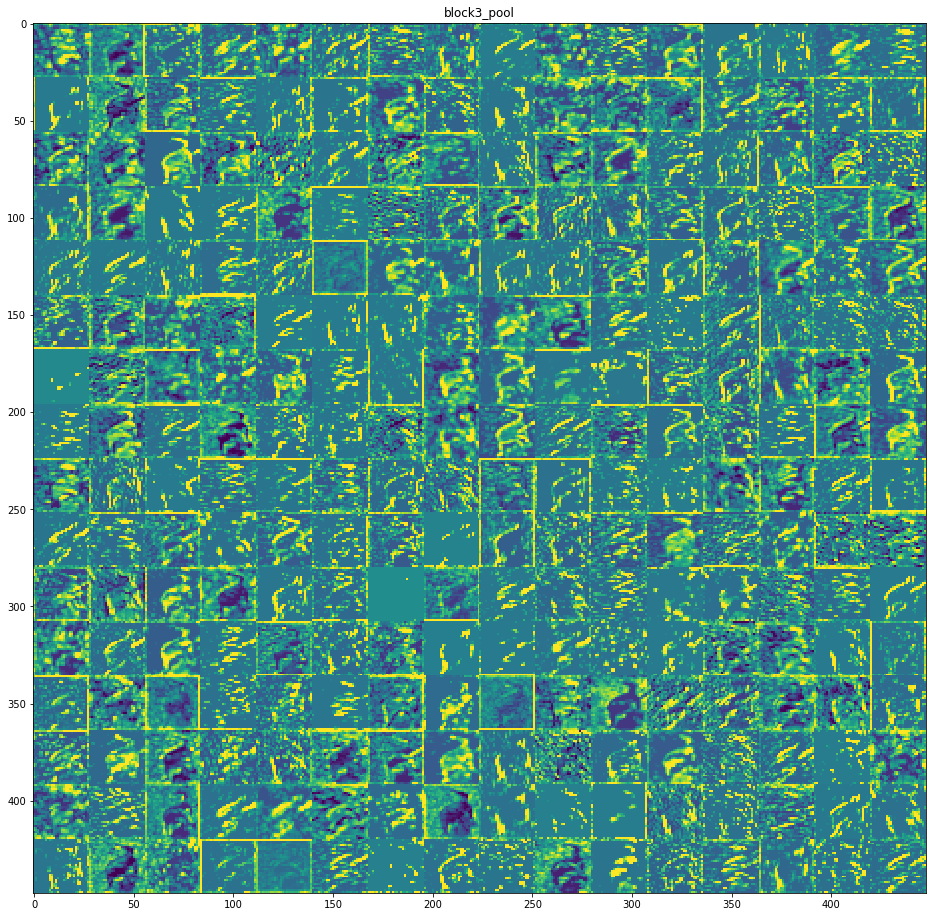

In [43]:
visualize_ConvNETs(11)

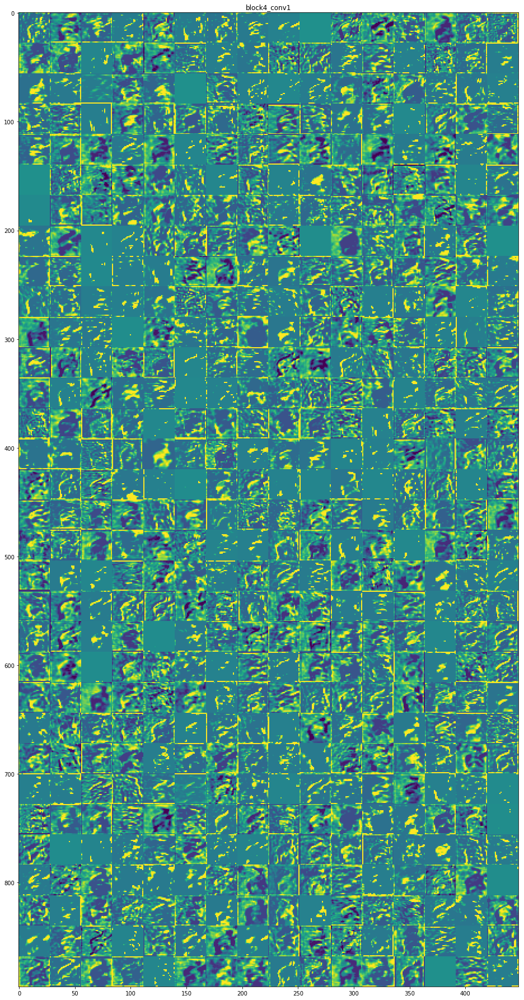

In [44]:
visualize_ConvNETs(12)

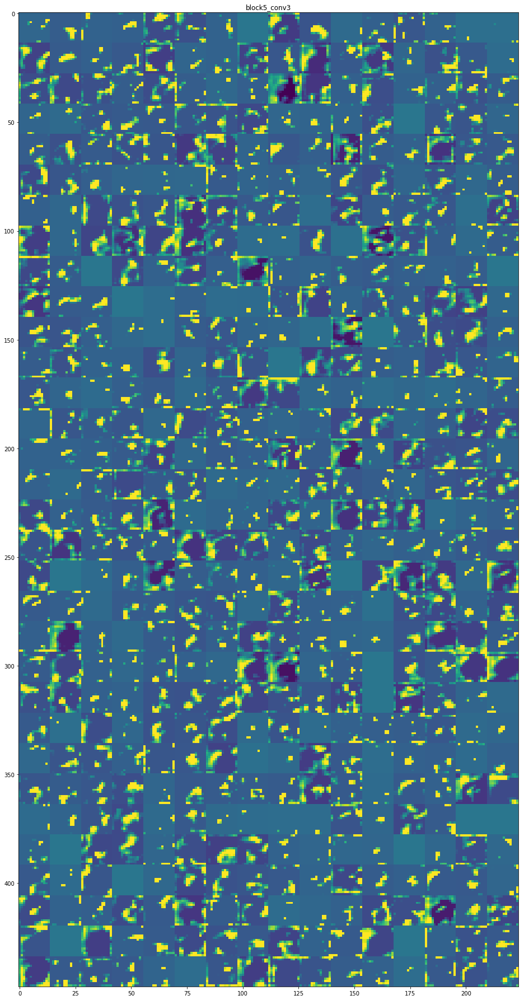

In [45]:
visualize_ConvNETs(19)

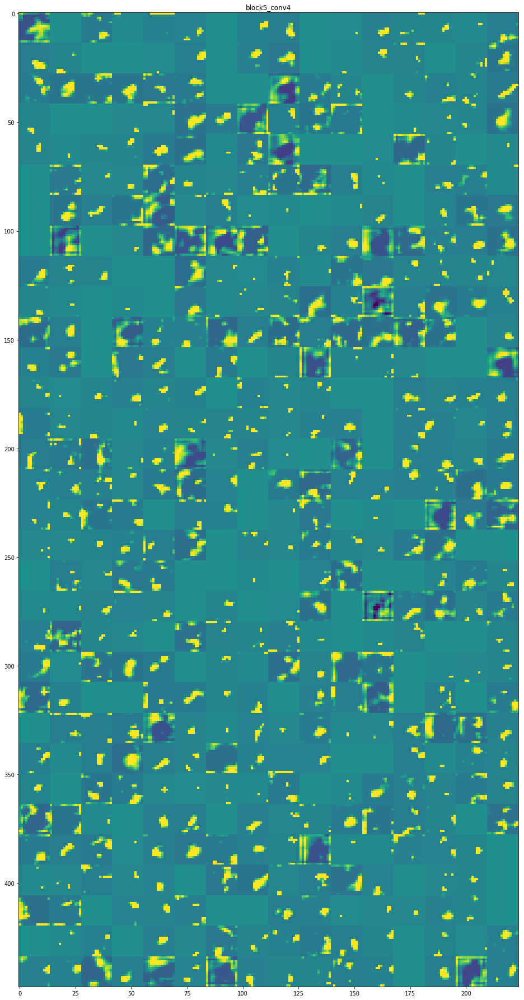

In [46]:
visualize_ConvNETs(20)

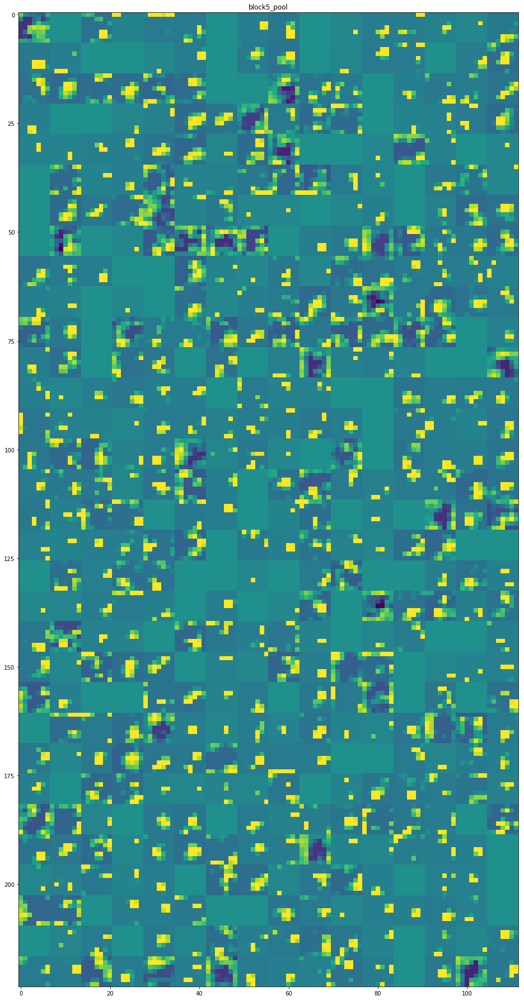

In [47]:
visualize_ConvNETs(21)

#T-SNE Visualization

In [0]:
from keras.preprocessing import image
import numpy as np

validation_images = []
labels = []

dog = os.listdir(validation_dogs_dir)
cat = os.listdir(validation_cats_dir)


validating_dog = [os.path.join(validation_dogs_dir, fname) for fname in dog[0:]]
validating_cat = [os.path.join(validation_cats_dir, fname) for fname in cat[0:]]


for i, img_path in enumerate(validating_cat+validating_dog):
  
  true_label = (img_path)[39:42]
  validating_dog.append(true_label)
  
  pred_img = image.load_img(img_path, target_size=(224,224))
  img_tensor = image.img_to_array(pred_img)
  img_tensor = np.expand_dims(img_tensor, axis=0)
  img_tensor /= 255.
  validation_images.append(img_tensor)

In [0]:

#Last Conv Layer
layer = model.get_layer('dense_1')
layer_output = layer.output

In [58]:
img_tensors_array = np.concatenate((validation_images))
activation_model = models.Model(input=model.input, outputs=[layer_output])
activations = activation_model.predict(img_tensors_array)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: UserWarning: Update your `Model` call to the Keras 2 API: `Model(outputs=[<tf.Tenso..., inputs=Tensor("in...)`
  


In [0]:

#Load packages
import time
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patheffects as PathEffects
%matplotlib inline
import seaborn as sns


In [0]:

class_names = ["cat", "dog"]

def data_scatter(vecs, labels):
    # choose a color palette with seaborn.
    num_classes = len(np.unique(labels))
    palette = np.array(sns.color_palette("husl", num_classes))

    # create a scatter plot.
    f = plt.figure(figsize=(12, 12))
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(vecs[:, 0], vecs[:, 1], c=palette[labels])
    plt.xlim(-25, 25)
    plt.ylim(-25, 25)
    ax.axis('off')
    ax.axis('tight')


    for idx in range(num_classes):

        # Place label at median position of vectors with corresponding label

        x_coord, y_coord = np.median(vecs[labels == idx, :], axis=0)
        txt = ax.text(x_coord, y_coord, class_names[idx], fontsize=16)
        # plot class index black with white contour
        txt.set_path_effects([
            PathEffects.Stroke(linewidth=6, foreground="w"),
            PathEffects.Normal()])

In [61]:

from sklearn.manifold import TSNE
import time
time_start = time.time()

cats_and_dogs_tsne = TSNE(random_state=10).fit_transform(activations)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time() - time_start))

t-SNE done! Time elapsed: 5.735113859176636 seconds


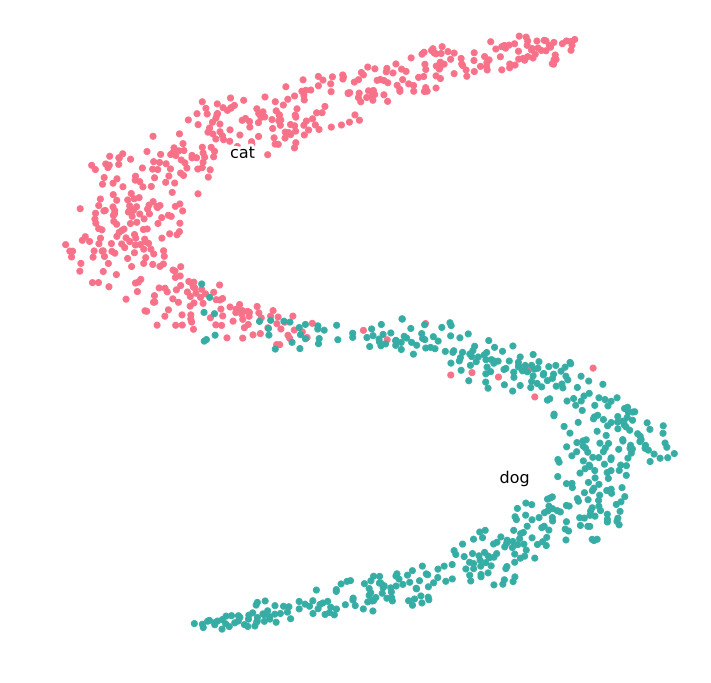

In [62]:
data_scatter(cats_and_dogs_tsne, validation_generator.classes)